In [1]:
# ------------------------------------------------------------------------
#
# TITLE - plot_fit_gse_v2_ksf.ipynb
# AUTHOR - James Lane
# PROJECT - ges-mass
#
# ------------------------------------------------------------------------
#
# Docstrings and metadata:
'''Plot the GSE fits done with the v2 KSF
'''

__author__ = "James Lane"

In [2]:
### Imports

# Basic
import os, sys, pdb, warnings, copy, dill as pickle
import numpy as np

# Matplotlib and plotting 
import matplotlib
import matplotlib.pyplot as plt
import corner

# Project specific
sys.path.insert(0,'../../src/')
from ges_mass import mass as pmass
from ges_mass import densprofiles as pdens
from ges_mass import util as putil
from ges_mass import plot as pplot

### Notebook setup

%matplotlib inline
plt.style.use('../../src/mpl/project.mplstyle') # This must be exactly here
%config InlineBackend.figure_format = 'retina'
%load_ext autoreload
%autoreload 2

/home/lane/software/miniconda3/envs/phd/lib/python3.10/site-packages/pkg_resources/__init__.py:123: PkgResourcesDeprecationWarning: 1. is an invalid version and will not be supported in a future release
  warnings.warn(


A new version of galpy (1.8.2) is available, please upgrade using pip/conda/... to get the latest features and bug fixes!
/home/lane/software/galpy/galpy/util/bovy_plot.py:7: FutureWarning: galpy.util.bovy_plot is being deprecated in favor of galpy.util.plot; functions inside of this module have also changed name, but all functions still exist; please switch to the new import and new function names, because the old import and function names will be removed in v1.9
  warnings.warn('galpy.util.bovy_plot is being deprecated in favor of galpy.util.plot; functions inside of this module have also changed name, but all functions still exist; please switch to the new import and new function names, because the old import and function names will be removed in v1.9',FutureWarning)



### Keywords, Pathing, Loading, Data Preparation

In [3]:
# %load ../../src/nb_modules/keywords_pathing_loading_data_prep.py
## Keywords
cdict = putil.load_config_to_dict()
keywords = ['BASE_DIR','APOGEE_DR','APOGEE_RESULTS_VERS','GAIA_DR','NDMOD',
            'DMOD_MIN','DMOD_MAX','LOGG_MIN','LOGG_MAX','FEH_MIN','FEH_MAX',
            'FEH_MIN_GSE','FEH_MAX_GSE','DF_VERSION','KSF_VERSION','NPROCS',
            'RO','VO','ZO']
base_dir,apogee_dr,apogee_results_vers,gaia_dr,ndmod,dmod_min,dmod_max,\
    logg_min,logg_max,feh_min,feh_max,feh_min_gse,feh_max_gse,df_version,\
    ksf_version,nprocs,ro,vo,zo = putil.parse_config_dict(cdict,keywords)
logg_range = [logg_min,logg_max]
feh_range = [feh_min,feh_max]
feh_range_gse = [feh_min_gse,feh_max_gse]
feh_range_all = [feh_min,feh_max_gse]
feh_range_fit = copy.deepcopy( feh_range_gse )# Need to choose here

df_version = 'v2_lb_ps_hb_tp'
ksf_version = 'v2.03_beta_03_6e8_09_1.5e8'

## Pathing
fit_paths = putil.prepare_paths(base_dir,apogee_dr,apogee_results_vers,gaia_dr,
                                df_version,ksf_version)
data_dir,version_dir,ga_dir,gap_dir,df_dir,ksf_dir,fit_dir = fit_paths

## Filenames
fit_filenames = putil.prepare_filenames(ga_dir,gap_dir,feh_range_gse)
apogee_SF_filename,apogee_effSF_filename,apogee_effSF_mask_filename,\
    iso_grid_filename,clean_kinematics_filename = fit_filenames

## File loading and data preparation
fit_stuff,other_stuff = putil.prepare_fitting(fit_filenames,
    [ndmod,dmod_min,dmod_max], ro,zo,return_other=True)
apogee_effSF_mask,dmap,iso_grid,jkmins,dmods,ds,effsel_grid,apof,\
    allstar_nomask,orbs_nomask = fit_stuff
Rgrid,phigrid,zgrid = effsel_grid

# ## Load the distribution functions
# df_filename = df_dir+'dfs.pkl'
# betas = [0.3,0.8]
# dfs = putil.load_distribution_functions(df_filename, betas)

Loading config file from /home/lane/projects/ges-mass/notebooks/config.txt

Loading APOGEE sel. func. from /geir_data/scr/lane/projects/ges-mass/data/gaia_apogee/apogee_dr16_l33_gaia_edr3/apogee_SF.dat
/home/lane/software/galpy/galpy/util/bovy_coords.py:8: FutureWarning: galpy.util.bovy_coords is being deprecated in favor of galpy.util.coords; all functions in there are the same; please switch to the new import, because the old import will be removed in v1.9
  warnings.warn('galpy.util.bovy_coords is being deprecated in favor of galpy.util.coords; all functions in there are the same; please switch to the new import, because the old import will be removed in v1.9',FutureWarning)


Loading APOGEE eff. sel. func. from /geir_data/scr/lane/projects/ges-mass/data/gaia_apogee/apogee_dr16_l33_gaia_edr3/apogee_effSF_grid_inclArea_-2.0_feh_-0.6.dat

Loading APOGEE eff. sel. func. mask from /geir_data/scr/lane/projects/ges-mass/data/gaia_apogee/apogee_dr16_l33_gaia_edr3/apogee_effSF_grid_mask.npy

### Global Parameters

In [4]:
# %load ../../src/nb_modules/global_fitting_params.py
## general kwargs
verbose = True

## HaloFit kwargs (ordering follows HaloFit.__init__)
# allstar and orbs loaded in prep cell
init = None
init_type = 'ML'
# fit_type provided at runtime
mask_disk = True
mask_halo = True
# densfunc, selec provided at runtime
# effsel, effsel_grid, effsel_mask, dmods loaded in prep cell
nwalkers = 100
nit = int(2e3)
ncut = int(1e3)
# usr_log_prior provided at runtime
n_mass = 2000 # int(nwalkers*(nit-ncut))
int_r_range = [2.,70.]
iso = None # Will read from iso_grid_filename
# iso_filename, jkmins loaded in prep cell
# feh_range provided at runtime
# logg_range loaded in config cell
# fit_dir, gap_dir, ksf_dir loaded in prep cell
# version provided at runtime
# ro, vo, zo loaded in config cell

hf_kwargs = {## HaloFit parameters
             'allstar':allstar_nomask,
             'orbs':orbs_nomask,
             'init':init,
             'init_type':init_type,
             # 'fit_type':fit_type, # provided at runtime
             'mask_disk':mask_disk,
             'mask_halo':mask_halo,
             ## _HaloFit parameters
             # 'densfunc':densfunc, # provided at runtime
             # 'selec':selec, # provided at runtime
             'effsel':apof,
             'effsel_mask':apogee_effSF_mask,
             'effsel_grid':effsel_grid,
             'dmods':dmods,
             'nwalkers':nwalkers,
             'nit':nit,
             'ncut':ncut,
             # 'usr_log_prior':usr_log_prior, # provided at runtime
             'n_mass':n_mass,
             'int_r_range':int_r_range,
             'iso':iso,
             'iso_filename':iso_grid_filename,
             'jkmins':jkmins,
             # 'feh_range':feh_range, # provided at runtime
             'logg_range':logg_range,
             'fit_dir':fit_dir,
             'gap_dir':gap_dir,
             'ksf_dir':ksf_dir,
             # 'version':version, # provided at runtime
             'verbose':verbose,
             'ro':ro,
             'vo':vo,
             'zo':zo}

## pmass.fit() function kwargs
# nprocs set in config file
force_fit = True
mle_init = True
just_mle = False
return_walkers = True
optimizer_method = 'Powell'
mass_int_type = 'spherical_grid'
batch_masses = True
make_ml_aic_bic = True
calculate_masses = True
post_optimization = True
mcmc_diagnostic = True

fit_kwargs = {# 'nprocs':nprocs, # Normally given at runtime 
              'force_fit':force_fit,
              'mle_init':mle_init,
              'just_mle':just_mle,
              'return_walkers':return_walkers,
              'optimizer_method':optimizer_method,
              'mass_int_type':mass_int_type,
              'batch_masses':batch_masses,
              'make_ml_aic_bic':make_ml_aic_bic,
              'calculate_masses':calculate_masses,
              'post_optimization':post_optimization,
              'mcmc_diagnostic':mcmc_diagnostic,
              }

## Convenience functions

Plots to make:
- Each needs its own kwargs
- Each needs to be called flexibly

1. Corner plot
- With / without masses
- Needs kwargs


2. Just masses
- Needs kwargs


3. Distance modulus posterior
- Needs kwargs
- Include log(radius on a twin axis)


4. Density profile / contours
- Needs kwargs
- Needs a hole in the center of the figure


5. Density vs. effective radius
- Should include effective volume to show where 

In [5]:
def make_plots(hf, make_arr, corner_kwargs={}, masses_kwargs={}, 
               dmod_posterior_kwargs={}, density_slice_kwargs={}, 
               density_re_kwargs={}, return_figs=True):
    '''make_arr is corner,masses,dmod_posterior,density_slice,density_re
    '''
    
    # Unpack boolean arrays
    make_corner, make_masses, make_dmod_posterior, make_density_slice,\
        make_density_re = make_arr
    
    # Make sure that the HaloFit object has the results loaded
    hf.get_results()
    hf.get_loglike_ml_aic_bic()
    
    figs = []
    
    # Make each figure
    if make_corner:
        print('Making corner figure')
        fig = pplot.plot_corner(hf, **corner_kwargs)
        fig.savefig(hf.fit_fig_dir+'corner.png')
        figs.append(fig)
        
    if make_masses:
        print('Making masses figure')
        fig = pplot.plot_masses(hf, **masses_kwargs)
        fig.savefig(hf.fit_fig_dir+'masses.png')
        figs.append(fig)
        
    if make_dmod_posterior:
        print('Making distance modulus posterior figure')
        fig = pplot.plot_distmod_posterior(hf, **dmod_posterior_kwargs)
        fig.savefig(hf.fit_fig_dir+'dmod_posterior.png')
        figs.append(fig)
        
    if make_density_slice:
        print('Making density slice figure')
        fig = pplot.plot_density_xyz(hf, **density_slice_kwargs)
        fig.savefig(hf.fit_fig_dir+'density_slice.png')
        figs.append(fig)
        
    if make_density_re:
        print('Make density vs effective radius figure')
        fig = pplot.plot_density_re(hf, **density_re_kwargs)
        fig.savefig(hf.fit_fig_dir+'density_re.png')
        figs.append(fig)
    
    if return_figs:
        return figs

## Plotting parameters

In [6]:
make_arr = [True,True,True,True,True]

corner_kwargs={'samples':None,
               'plot_mass':False,
               'thin':None,
               'thin_to':int(1e6),
               'quantiles':[0.16,0.5,0.84],
               'show_titles':True,
               'truths':'post',
               'corner_kwargs':{}}

masses_kwargs={}

dmod_posterior_kwargs={'nrand':50,
                       }

density_slice_kwargs={'contour':True,
                     }
                      #'contour_kwargs':{'colors':'Black',
                      #                  'levels':[0.5,1.,1.5,2.]}}

density_re_kwargs={'nrand':50,
                   'plot_physical':True,
                   }

return_figs = True

plot_kwargs = {'corner_kwargs':corner_kwargs,
               'masses_kwargs':masses_kwargs,
               'dmod_posterior_kwargs':dmod_posterior_kwargs,
               'density_slice_kwargs':density_slice_kwargs,
               'density_re_kwargs':density_re_kwargs,
               'return_figs':return_figs
              }

## Plotting fits with GS/E [Fe/H] range, using 100w_2e3n version

In [15]:
feh_range_fit = copy.deepcopy(feh_range_gse)
version = '100w_2e3n_ksf_v2.03'
fit_type = 'gse'

## e-Lz selection

In [16]:
selec = ['eLz',]
densfunc = pdens.triaxial_single_angle_zvecpa
def usr_log_prior(densfunc,params):
    return None
hf = pmass.HaloFit(densfunc=densfunc,
                   selec=selec,
                   fit_type=fit_type,
                   feh_range=feh_range_fit,
                   version=version,
                   **hf_kwargs)
print(hf.version)
print(hf.n_star)

Loading APOGEE kin. eff. sel. grid from /geir_data/scr/lane/projects/ges-mass/data/ksf/apogee_dr16_l33_gaia_edr3/v2_lb_ps_hb_tp/v2.03_beta_03_6e8_09_1.5e8/kSF_grid_linear_eLz.dat
Using informed init
init_type: uninformed
densfunc_source: None
100w_2e3n_ksf_v2.03/
151


### Triaxial single power law

In [17]:
# densfunc = pdens.triaxial_single_angle_zvecpa
# hf.set_densfunc(densfunc)
# figs = make_plots(hf,make_arr,**plot_kwargs)

In [18]:
# densfunc = pdens.triaxial_single_angle_zvecpa_plusexpdisk
# hf.set_densfunc(densfunc,usr_log_prior=usr_log_prior)
# figs = make_plots(hf,make_arr,**plot_kwargs)

### Triaxial exponentially truncated single power law

In [19]:
# densfunc = pdens.triaxial_single_cutoff_zvecpa
# hf.set_densfunc(densfunc,usr_log_prior=usr_log_prior)
# figs = make_plots(hf,make_arr,corner_kwargs=corner_kwargs)

Setting densfunc to: triaxial_single_cutoff_zvecpa_plusexpdisk
Version is: 100w_2e3n_ksf_v2.03/
Using init_type: ML
init_type: uninformed
densfunc_source: triaxial_single_cutoff_zvecpa
source_fit_data_dir: /geir_data/scr/lane/projects/ges-mass/data/fitting/data/gse/eLz/-2.0_feh_-0.6/triaxial_single_cutoff_zvecpa/100w_2e3n_ksf_v2.03/
Set self.ml, self.ml_ind, self.aic, self.bic
Set self.loglike
Making corner figure
thinning to N=1000000, thinning by factor 1
Making masses figure
Making distance modulus posterior figure
Calculating p(distmod|model)..
plotting.. pdistmod for 50/50
Making density slice figure
params not supplied, trying post optimization result
/home/lane/projects/ges-mass/notebooks/6-fit_dens/../../src/ges_mass/plot.py:357: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()

Make density vs effective radius figure


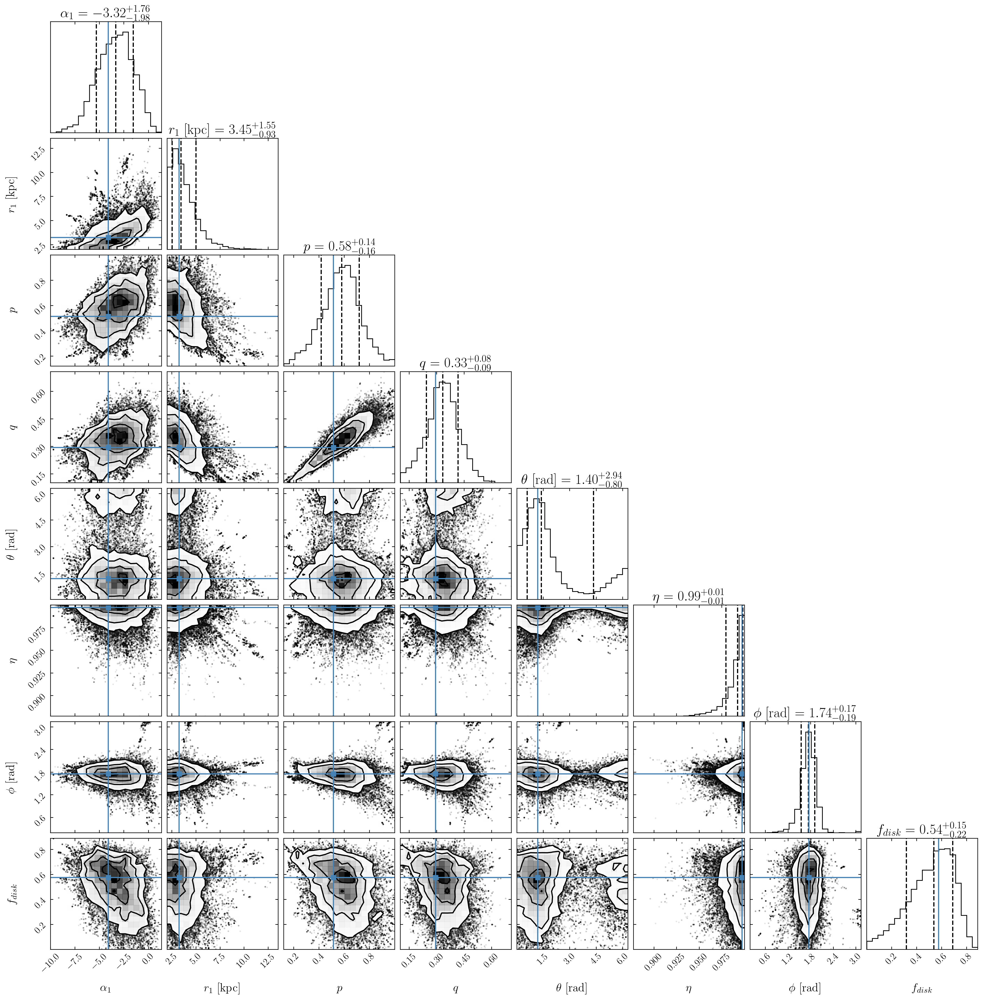

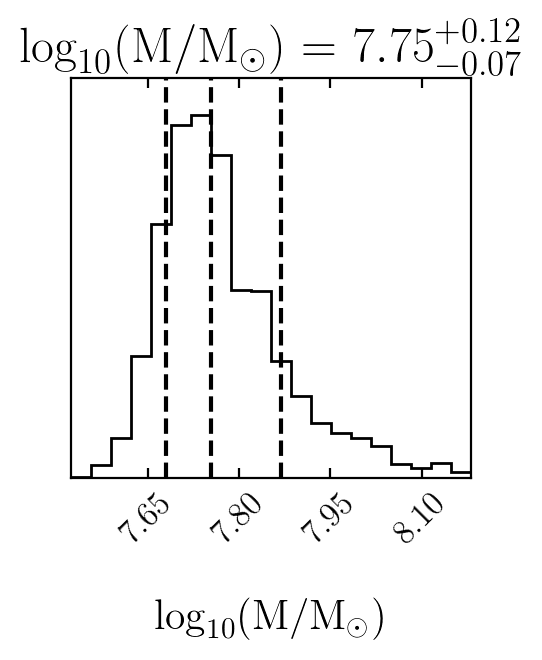

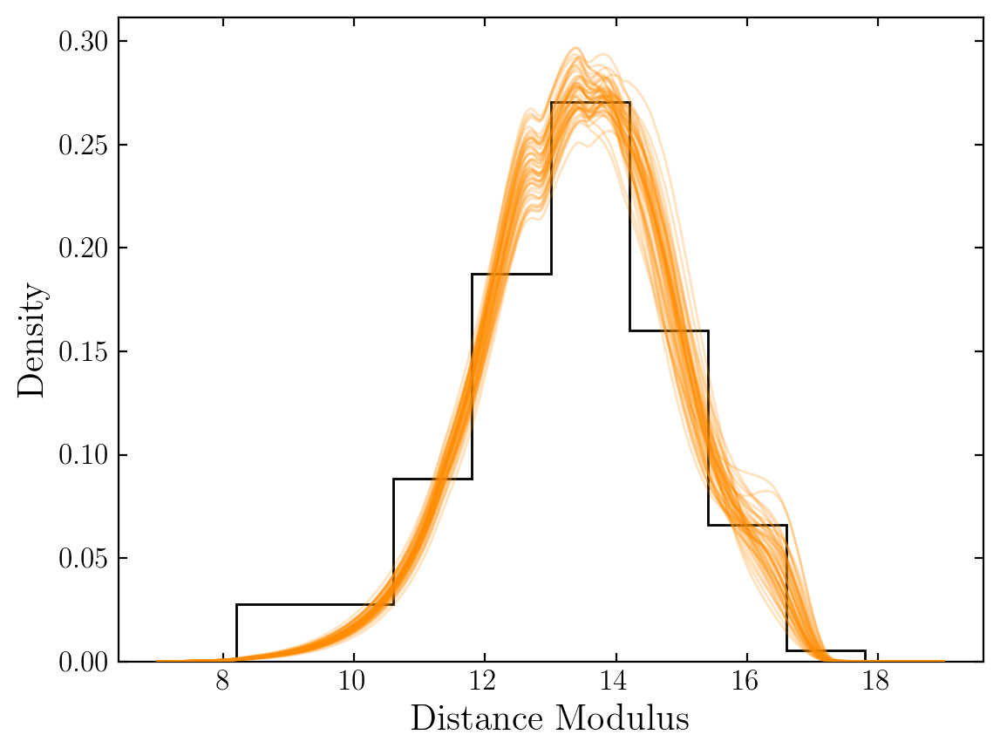

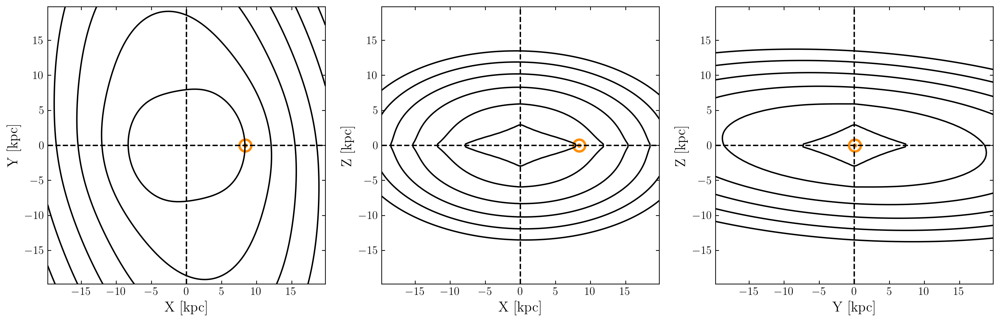

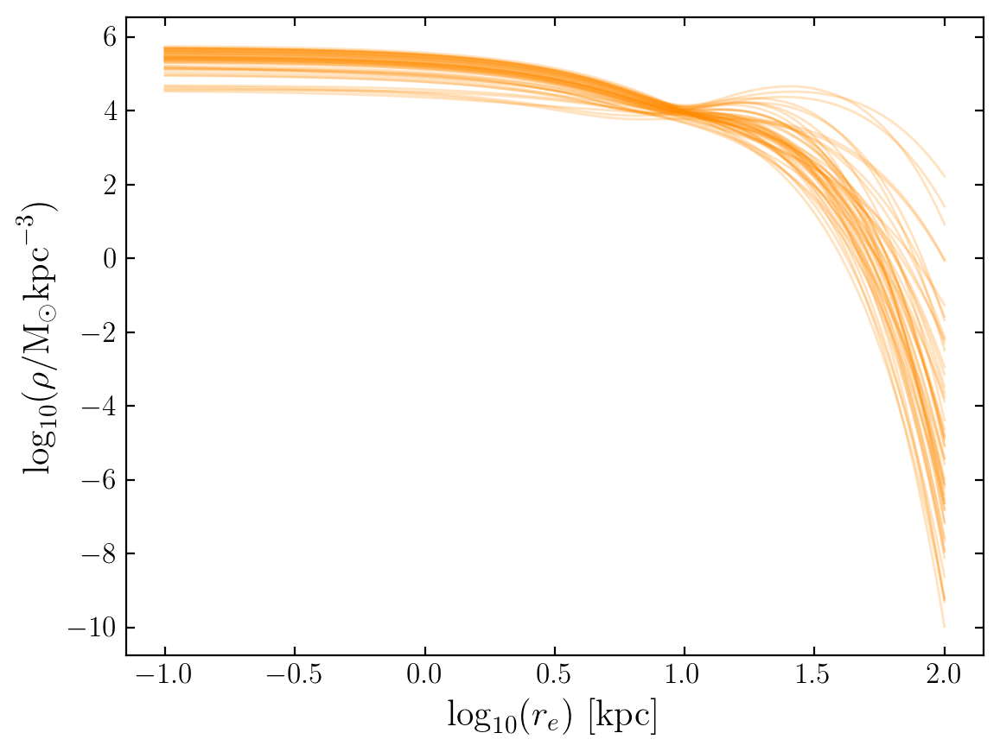

In [20]:
densfunc = pdens.triaxial_single_cutoff_zvecpa_plusexpdisk
hf.set_densfunc(densfunc,usr_log_prior=usr_log_prior)
figs = make_plots(hf,make_arr,**plot_kwargs)

### Triaxial broken power law

In [ ]:
# densfunc = pdens.triaxial_broken_angle_zvecpa
# hf.set_densfunc(densfunc,usr_log_prior=usr_log_prior)
# figs = make_plots(hf,make_arr,**plot_kwargs)

In [ ]:
# densfunc = pdens.triaxial_broken_angle_zvecpa_plusexpdisk
# hf.set_densfunc(densfunc,usr_log_prior=usr_log_prior)
# figs = make_plots(hf,make_arr,**plot_kwargs)

In [ ]:
# densfunc = pdens.triaxial_broken_angle_zvecpa_inv
# hf.set_densfunc(densfunc)
# figs = make_plots(hf,make_arr,corner_kwargs=corner_kwargs)

### Triaxial double broken power law

In [ ]:
# densfunc = pdens.triaxial_double_broken_angle_zvecpa
# hf.set_densfunc(densfunc,usr_log_prior=usr_log_prior)
# figs = make_plots(hf,make_arr,**plot_kwargs)

In [ ]:
# densfunc = pdens.triaxial_double_broken_angle_zvecpa_plusexpdisk
# hf.set_densfunc(densfunc,usr_log_prior=usr_log_prior)
# figs = make_plots(hf,make_arr,**plot_kwargs)

## AD selection

In [21]:
selec = ['AD',]
densfunc = pdens.triaxial_single_angle_zvecpa
def usr_log_prior(densfunc,params):
    return None
hf = pmass.HaloFit(densfunc=densfunc,
                   selec=selec,
                   fit_type=fit_type,
                   feh_range=feh_range_fit,
                   version=version,
                   **hf_kwargs)
print(hf.version)
print(hf.n_star)

Loading APOGEE kin. eff. sel. grid from /geir_data/scr/lane/projects/ges-mass/data/ksf/apogee_dr16_l33_gaia_edr3/v2_lb_ps_hb_tp/v2.03_beta_03_6e8_09_1.5e8/kSF_grid_linear_AD.dat
Using informed init
init_type: uninformed
densfunc_source: None
100w_2e3n_ksf_v2.03/
73


### Triaxial single power law

In [22]:
# densfunc = pdens.triaxial_single_angle_zvecpa
# hf.set_densfunc(densfunc)
# figs = make_plots(hf,make_arr,**plot_kwargs)

In [23]:
# densfunc = pdens.triaxial_single_angle_zvecpa_plusexpdisk
# hf.set_densfunc(densfunc,usr_log_prior=usr_log_prior)
# figs = make_plots(hf,make_arr,**plot_kwargs)

### Triaxial exponentially truncated single power law

Setting densfunc to: triaxial_single_cutoff_zvecpa
Version is: 100w_2e3n_ksf_v2.03/
Using init_type: ML
init_type: uninformed
densfunc_source: triaxial_single_angle_zvecpa
source_fit_data_dir: /geir_data/scr/lane/projects/ges-mass/data/fitting/data/gse/AD/-2.0_feh_-0.6/triaxial_single_angle_zvecpa/100w_2e3n_ksf_v2.03/
Set self.ml, self.ml_ind, self.aic, self.bic
Set self.loglike
Making corner figure
thinning to N=1000000, thinning by factor 1
Making masses figure
Making distance modulus posterior figure
Calculating p(distmod|model)..
plotting.. pdistmod for 50/50
Making density slice figure
params not supplied, trying post optimization result
/home/lane/projects/ges-mass/notebooks/6-fit_dens/../../src/ges_mass/plot.py:357: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()

Make density vs effective radius figure


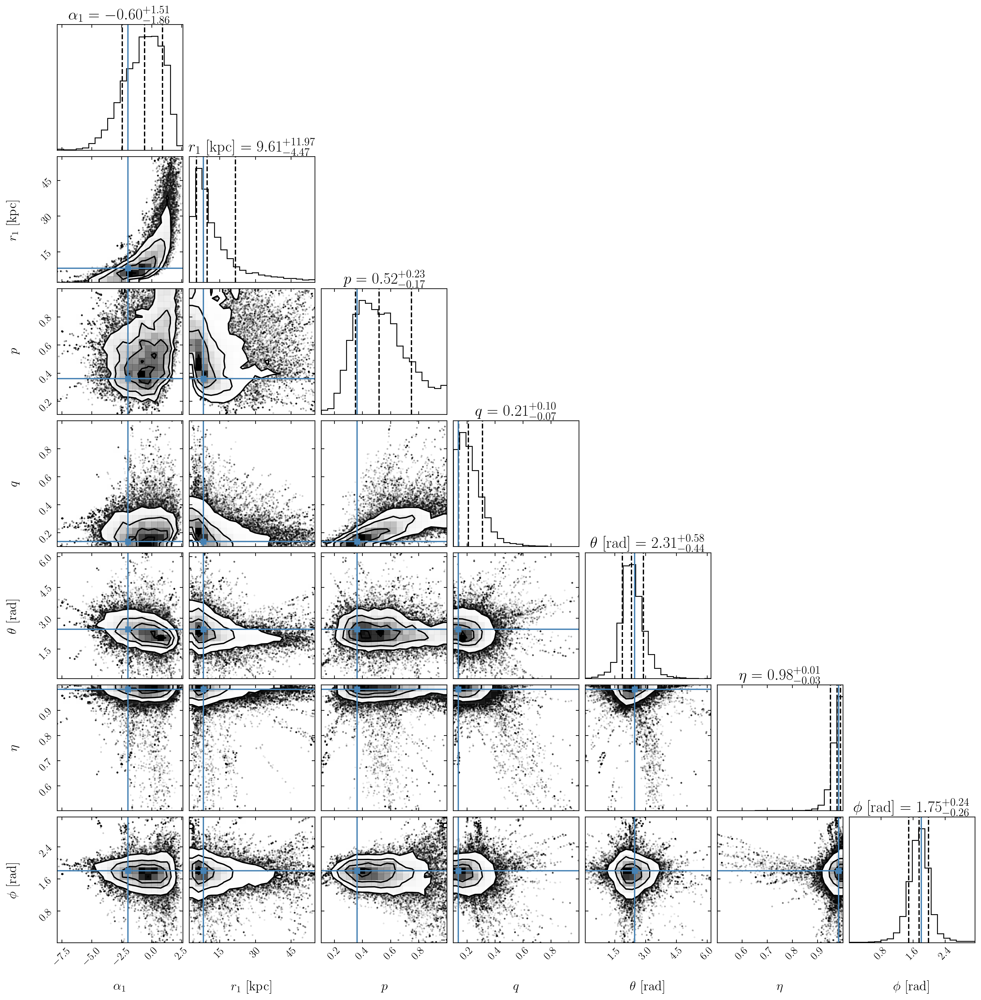

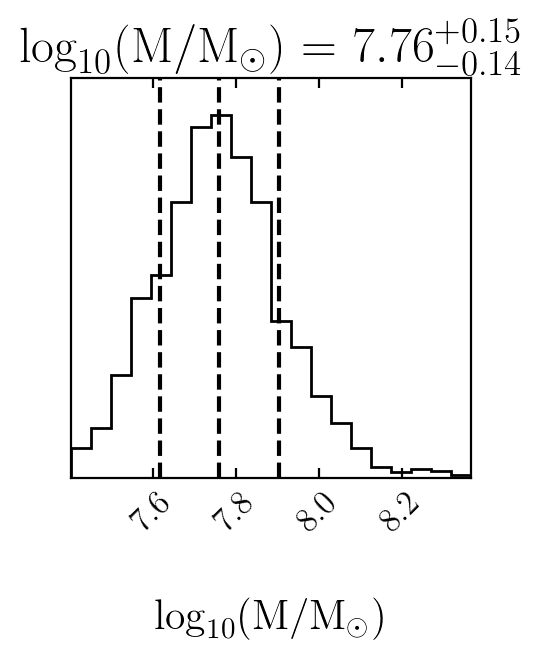

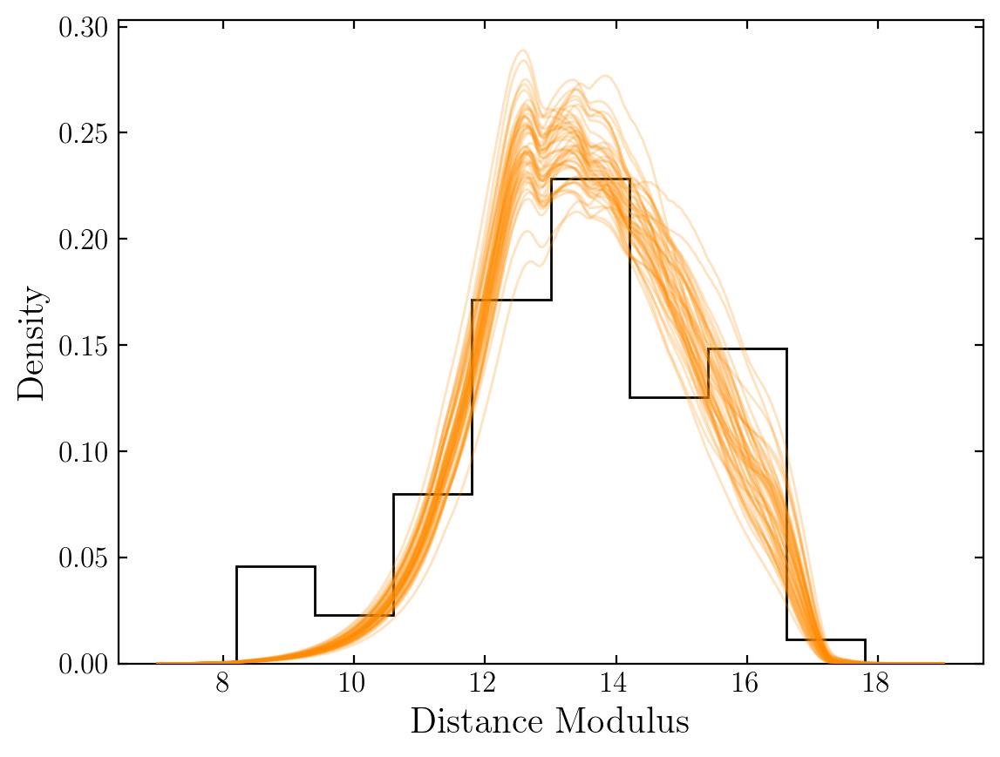

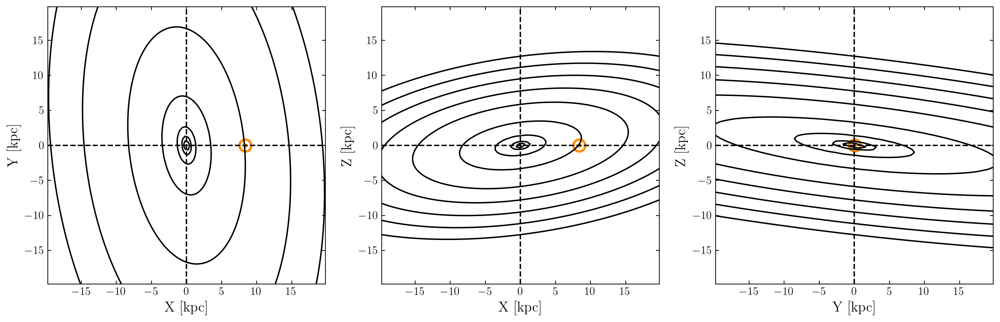

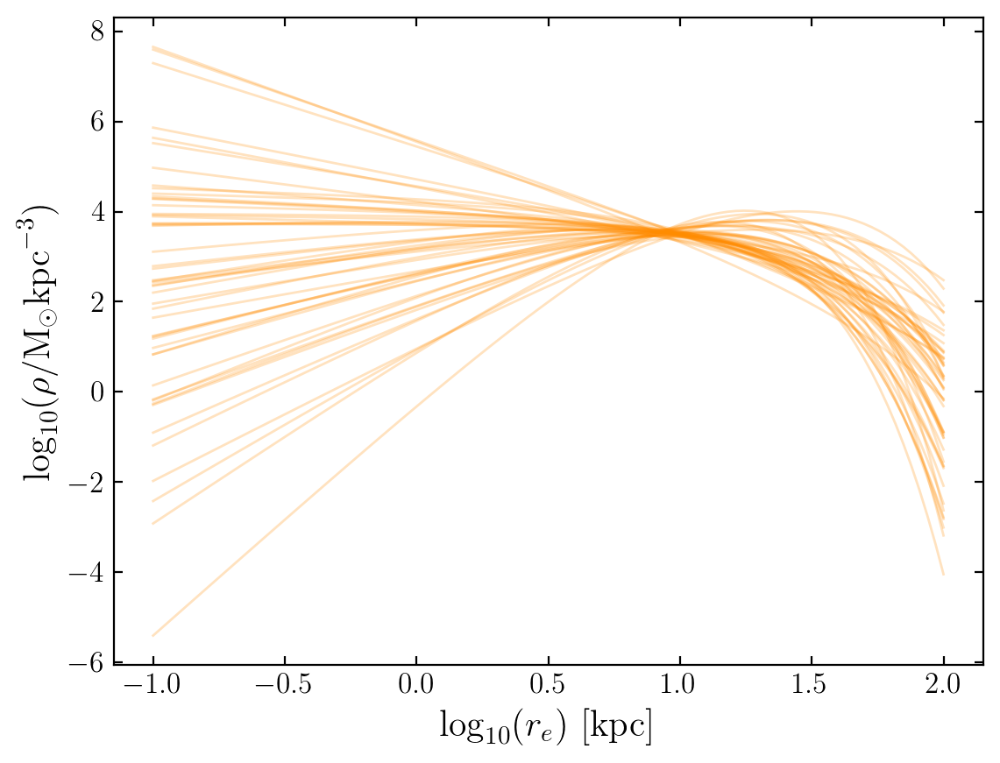

In [24]:
densfunc = pdens.triaxial_single_cutoff_zvecpa
hf.set_densfunc(densfunc,usr_log_prior=usr_log_prior)
figs = make_plots(hf,make_arr,**plot_kwargs)

In [25]:
# densfunc = pdens.triaxial_single_cutoff_zvecpa_plusexpdisk
# hf.set_densfunc(densfunc,usr_log_prior=usr_log_prior)
# figs = make_plots(hf,make_arr,**plot_kwargs)

### Triaxial broken power law

In [26]:
# densfunc = pdens.triaxial_broken_angle_zvecpa
# hf.set_densfunc(densfunc,usr_log_prior=usr_log_prior)
# figs = make_plots(hf,make_arr,**plot_kwargs)

In [27]:
# densfunc = pdens.triaxial_broken_angle_zvecpa_plusexpdisk
# hf.set_densfunc(densfunc,usr_log_prior=usr_log_prior)
# figs = make_plots(hf,make_arr,**plot_kwargs)

### Triaxial Double Broken Power Law

In [28]:
# densfunc = pdens.triaxial_double_broken_angle_zvecpa
# hf.set_densfunc(densfunc,usr_log_prior=usr_log_prior)
# figs = make_plots(hf,make_arr,**plot_kwargs)

In [29]:
# densfunc = pdens.triaxial_double_broken_angle_zvecpa_plusexpdisk
# hf.set_densfunc(densfunc,usr_log_prior=usr_log_prior)
# figs = make_plots(hf,make_arr,**plot_kwargs)

## Plot fits to data with JRLz selection, GS/E [Fe/H] range

In [30]:
selec = ['JRLz',]
densfunc = pdens.triaxial_single_angle_zvecpa
def usr_log_prior(densfunc,params):
    return None
hf = pmass.HaloFit(densfunc=densfunc,
                   selec=selec,
                   fit_type=fit_type,
                   feh_range=feh_range_fit,
                   version=version,
                   **hf_kwargs)
print(hf.version)
print(hf.n_star)

Loading APOGEE kin. eff. sel. grid from /geir_data/scr/lane/projects/ges-mass/data/ksf/apogee_dr16_l33_gaia_edr3/v2_lb_ps_hb_tp/v2.03_beta_03_6e8_09_1.5e8/kSF_grid_linear_JRLz.dat
Using informed init
init_type: uninformed
densfunc_source: None
100w_2e3n_ksf_v2.03/
300


### Triaxial single power law

In [31]:
# densfunc = pdens.triaxial_single_angle_zvecpa
# hf.set_densfunc(densfunc,usr_log_prior=usr_log_prior)
# figs = make_plots(hf,make_arr,**plot_kwargs)

Setting densfunc to: triaxial_single_angle_zvecpa_plusexpdisk
Version is: 100w_2e3n_ksf_v2.03/
Using init_type: ML
init_type: uninformed
densfunc_source: triaxial_single_angle_zvecpa
source_fit_data_dir: /geir_data/scr/lane/projects/ges-mass/data/fitting/data/gse/JRLz/-2.0_feh_-0.6/triaxial_single_angle_zvecpa/100w_2e3n_ksf_v2.03/
Set self.ml, self.ml_ind, self.aic, self.bic
Set self.loglike
Making corner figure
thinning to N=1000000, thinning by factor 1
Making masses figure
Making distance modulus posterior figure
Calculating p(distmod|model)..
plotting.. pdistmod for 50/50
Making density slice figure
params not supplied, trying post optimization result
/home/lane/projects/ges-mass/notebooks/6-fit_dens/../../src/ges_mass/plot.py:357: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()

Make density vs effective radius figure


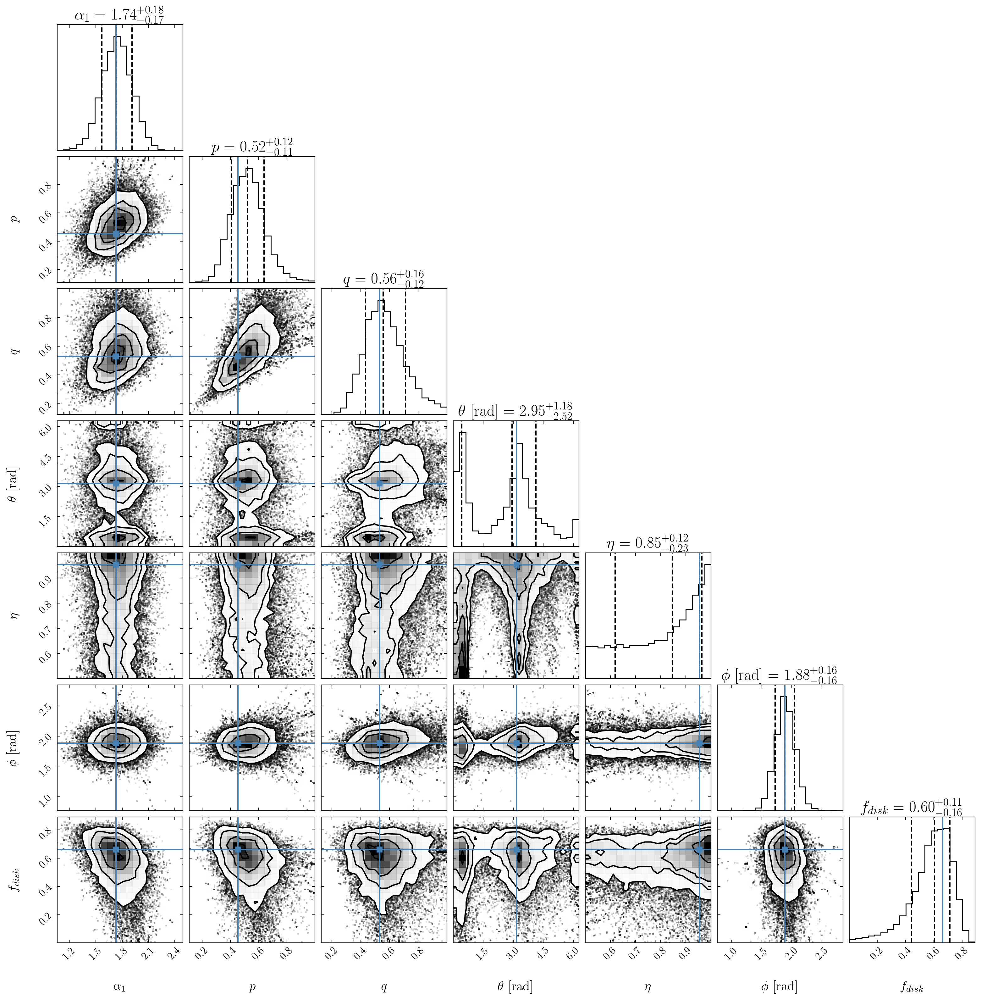

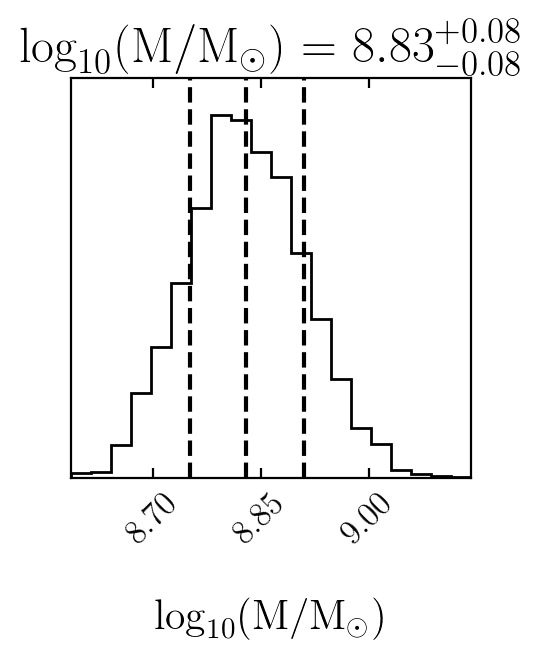

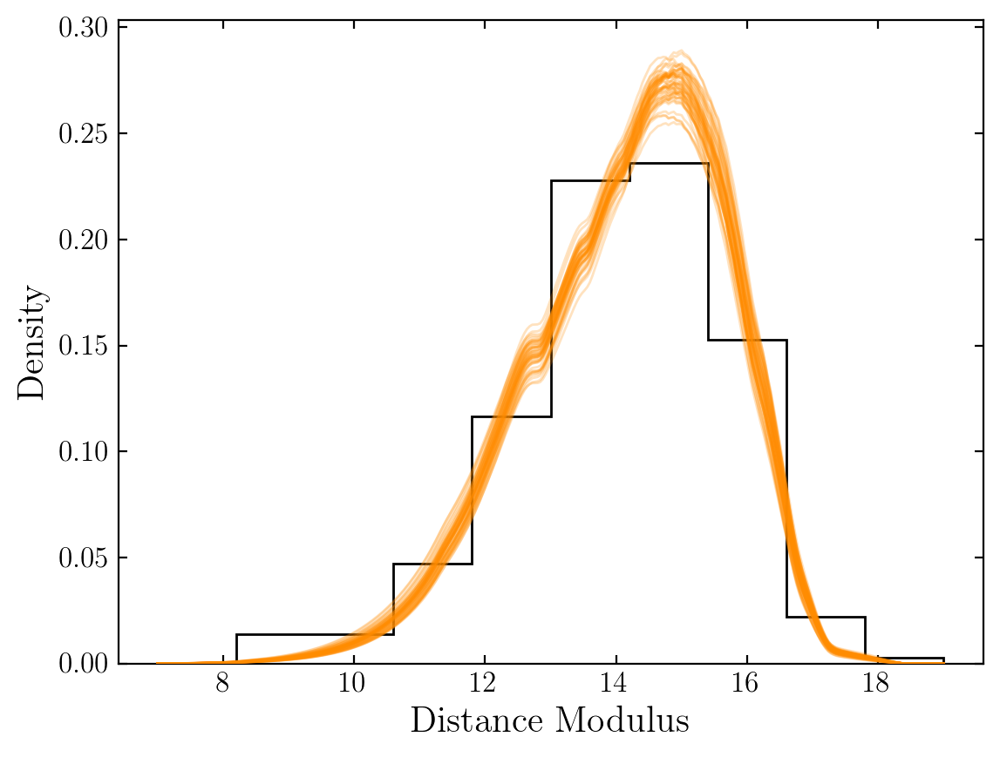

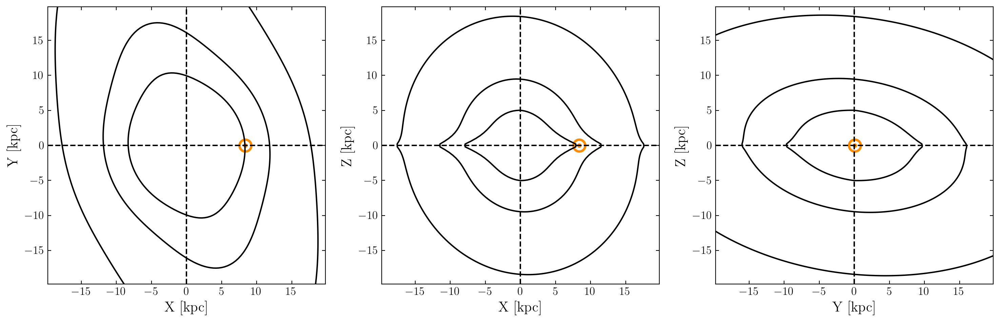

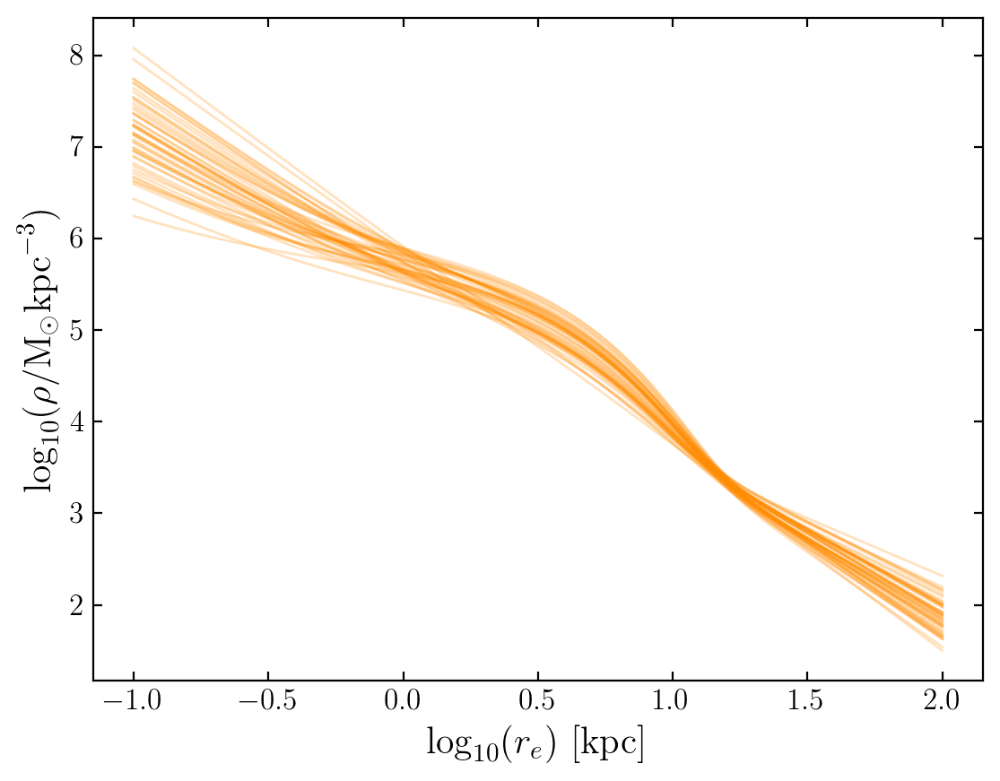

In [32]:
densfunc = pdens.triaxial_single_angle_zvecpa_plusexpdisk
hf.set_densfunc(densfunc,usr_log_prior=usr_log_prior)
figs = make_plots(hf,make_arr,**plot_kwargs)

### Triaxial exponentially truncated single power law

In [ ]:
# densfunc = pdens.triaxial_single_cutoff_zvecpa
# hf.set_densfunc(densfunc,usr_log_prior=usr_log_prior)
# figs = make_plots(hf,make_arr,corner_kwargs=corner_kwargs)

In [ ]:
# densfunc = pdens.triaxial_single_cutoff_zvecpa_plusexpdisk
# hf.set_densfunc(densfunc,usr_log_prior=usr_log_prior)
# figs = make_plots(hf,make_arr,corner_kwargs=corner_kwargs)

### Triaxial broken power law

In [ ]:
# densfunc = pdens.triaxial_broken_angle_zvecpa
# hf.set_densfunc(densfunc,usr_log_prior=usr_log_prior)
# figs = make_plots(hf,make_arr,**plot_kwargs)

In [ ]:
# densfunc = pdens.triaxial_broken_angle_zvecpa_plusexpdisk
# hf.set_densfunc(densfunc,usr_log_prior=usr_log_prior)
# figs = make_plots(hf,make_arr,**plot_kwargs)

### Triaxial Double Broken Power Law

In [ ]:
# densfunc = pdens.triaxial_double_broken_angle_zvecpa
# hf.set_densfunc(densfunc,usr_log_prior=usr_log_prior)
# figs = make_plots(hf,make_arr,**plot_kwargs)

In [ ]:
# densfunc = pdens.triaxial_double_broken_angle_zvecpa_plusexpdisk
# hf.set_densfunc(densfunc,usr_log_prior=usr_log_prior)
# figs = make_plots(hf,make_arr,**plot_kwargs)